In [15]:
import glob
import os
from PIL import Image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from facenet_pytorch import MTCNN, InceptionResnetV1

In [16]:
img_pth = './image'
test_pth = './test_img'

mtcnn = MTCNN(image_size=224, margin=70)
resnet = InceptionResnetV1(pretrained='vggface2').eval()

In [17]:
for file_pth in glob.glob(os.path.join(img_pth, '*')):
    print(glob.glob(os.path.join(file_pth, '*[.jpg-.jpeg]')))

['./image/kenshi/kenshi_1.jpg', './image/kenshi/playstation-kenshi-yonezu-cm-onair-00a.jpg', './image/kenshi/theme-4-1596724081.jpg']
['./image/trump/1200x-1.jpg', './image/trump/donald-trump-delaware-county-fairgrounds-1880x1254.jpg', './image/trump/_126965958_trump-011022-reuters.jpg']
['./image/khaby/16449333.jpeg', './image/khaby/Who-Is-Khaby-Lame-Say-Hello-to-the-TikTok-King-Turned-Fashion-Icon3.jpg', './image/khaby/Khaby-Lame-ink.jpeg.optimal.jpeg']
['./image/rock/images.jpeg', './image/rock/3bdb2575-9a92-42f8-8472-bb78c7bd118a_720x405.jpg', './image/rock/Dwayne_Johnson_2014.jpg']
['./image/kirby/template-jdg-2022-03-17t173231-259.jpg', './image/kirby/RMS34KKW5RHFDCB4KHMJSLE7NY.jpg', './image/kirby/1648039850821.jpg']
['./image/daoko/709dfae684560a9c5367fde004ca2d75.jpg', './image/daoko/B4RMSpVh.jpg', './image/daoko/Daoko-p1.jpg']
['./image/musk/107083077-1656593419933-gettyimages-1395062617-t_w16437_4934a878-972d-4bea-b6ef-b61f4ceeb787.jpeg', './image/musk/ap22183615163992-60f12

# Process

origin image


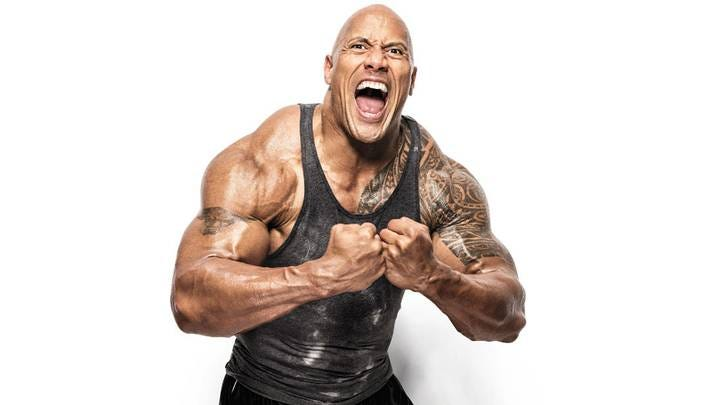

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


cropped image


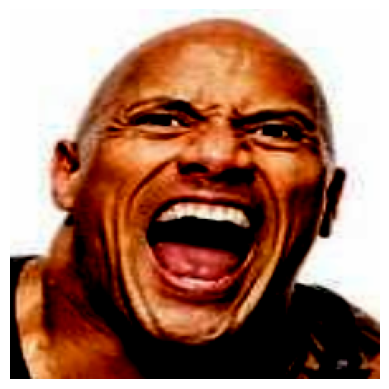

emb shape: torch.Size([1, 512])


In [18]:
# origin image
img = Image.open(os.path.join(img_pth, 'rock/3bdb2575-9a92-42f8-8472-bb78c7bd118a_720x405.jpg'))
print('origin image')
display(img)

# image crop & embedding
img_cropped = mtcnn(img)
img_emb = resnet(img_cropped.unsqueeze(0))

# cropped image
print('cropped image')
plt.imshow(img_cropped.permute(1, 2, 0).numpy())
plt.axis('off')
plt.show()

# image_emb vector
print('emb shape:', img_emb.shape)
# print(img_emb)

# 取得所有人的 image_embedding vector

In [53]:
emb_dict = {}
for file_pth in glob.glob(os.path.join(img_pth, '*')):
    label = file_pth.split('/')[-1]
    emb_ls = []
    for target_pth in glob.glob(os.path.join(file_pth, '*[.jpg-.jpeg]')):
        img = Image.open(target_pth) 
        img_cropped = mtcnn(img)
        if img_cropped == None:
            emb_ls.append('_')
            continue
        img_emb = resnet(img_cropped.unsqueeze(0))
        emb_ls.append(img_emb.detach().numpy()[0])    # for pandas
    emb_dict[label] = emb_ls
    
tmp = pd.DataFrame.from_dict(emb_dict)
np.shape(tmp)

(3, 8)

In [54]:
tmp

,kenshi,trump,khaby,rock,kirby,daoko,musk,billie
0,"[0.07168858, -0.02032447, -0.06988846, 0.04114...","[0.07649511, -0.062337175, 0.0765741, 0.009208...","[0.047928102, -0.017115468, 0.016923053, 0.001...","[0.042524777, -0.06490536, -0.070652395, 0.048...",_,"[0.0048255664, 0.0078798635, -0.053856067, 0.0...","[0.073596045, -0.029723017, -0.03761698, -0.08...","[-0.02757433, -0.03535355, -0.08586909, -0.061..."
1,"[-0.042062476, -0.007851467, -0.039861284, 0.0...","[0.080723725, -0.04726081, 0.08628109, 0.01281...","[-0.020419143, -0.020860063, -0.037777003, 0.0...","[0.047120064, -0.029728746, -0.021727882, 0.09...",_,"[-0.0149479965, 0.029816793, -0.11077428, -0.0...","[0.082158394, 0.0062495368, 0.014179546, -0.02...","[-0.02740659, -0.023281276, -0.014830886, 0.00..."
2,"[0.033700094, -0.03823737, -0.04583399, 0.0454...","[0.06981631, -0.08563874, 0.08777909, 0.008273...","[0.030490797, -0.037990034, -0.0028010784, 0.0...","[0.031206265, -0.057269797, -0.075658634, 0.03...",_,"[-0.0054000574, -0.018309765, -0.108062334, 0....","[0.019828167, -0.04228364, -0.06701089, -0.029...","[-0.03007577, 0.023452863, 0.026151113, 0.0689..."


# 測試 test_img

In [136]:
img = Image.open(os.path.join(test_pth, 'rock.jpg'))
img_cropped = mtcnn(img)
img_emb = resnet(img_cropped.unsqueeze(0)).detach().numpy()[0]    # to numpy

distance_dict = {}
for label in emb_dict:
    print(label)
    emb_distance = 0
    norm = len(emb_dict[label])
    
    if '_' in emb_dict[label]: continue
    
    for vec in emb_dict[label]:
        emb_distance += np.linalg.norm(img_emb - vec)
        
    emb_distance /= norm
    distance_dict[label] = emb_distance
    
distance_dict

kenshi
trump
khaby
rock
kirby
daoko
musk
billie


/tmp/ipykernel_297361/1477017981.py:11: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if '_' in emb_dict[label]: continue


{'kenshi': 1.2888318697611492,
 'trump': 1.500334898630778,
 'khaby': 1.318636417388916,
 'rock': 0.714217483997345,
 'daoko': 1.3760557572046916,
 'musk': 1.2941985130310059,
 'billie': 1.418903072675069}

In [137]:
label_keys = list(distance_dict.keys())
min_dis = min(list(distance_dict.values()))
min_idx = list(distance_dict.values()).index(min_dis)
pred_label = label_keys[min_idx]

thresh = 2.0
score = (thresh-min_dis)/thresh

print('predicte:', pred_label)
print('distance:', min_dis)
print(f'score: {score} %')

predicte: rock
distance: 0.714217483997345
score: 0.6428912580013275 %


# 功能實做

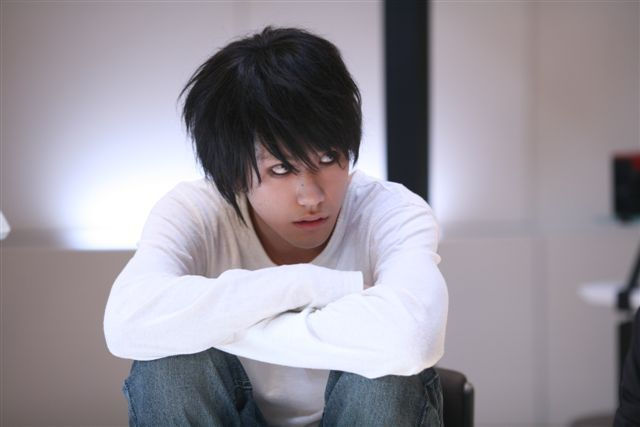

predicte: kenshi
distance: 0.9191136161486307
score: 58.22210835688043 %


/tmp/ipykernel_297361/2890486978.py:13: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if '_' in emb_dict[label]: continue


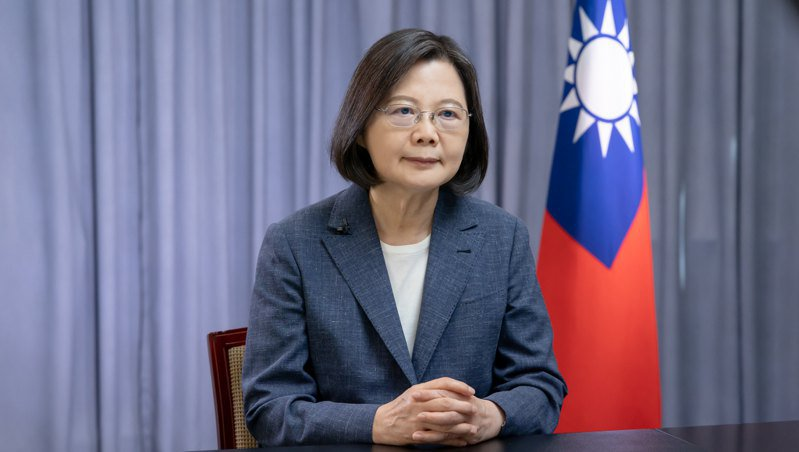

predicte: kenshi
distance: 1.2598283688227336
score: 42.735074144421205 %


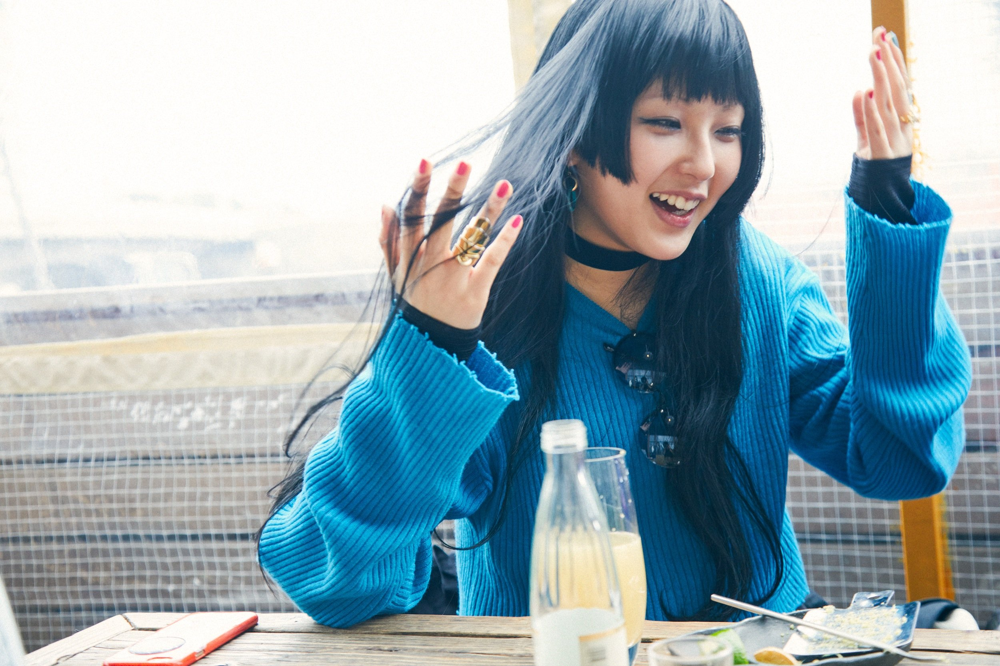

predicte: daoko
distance: 0.5826398531595866
score: 73.5163703109279 %


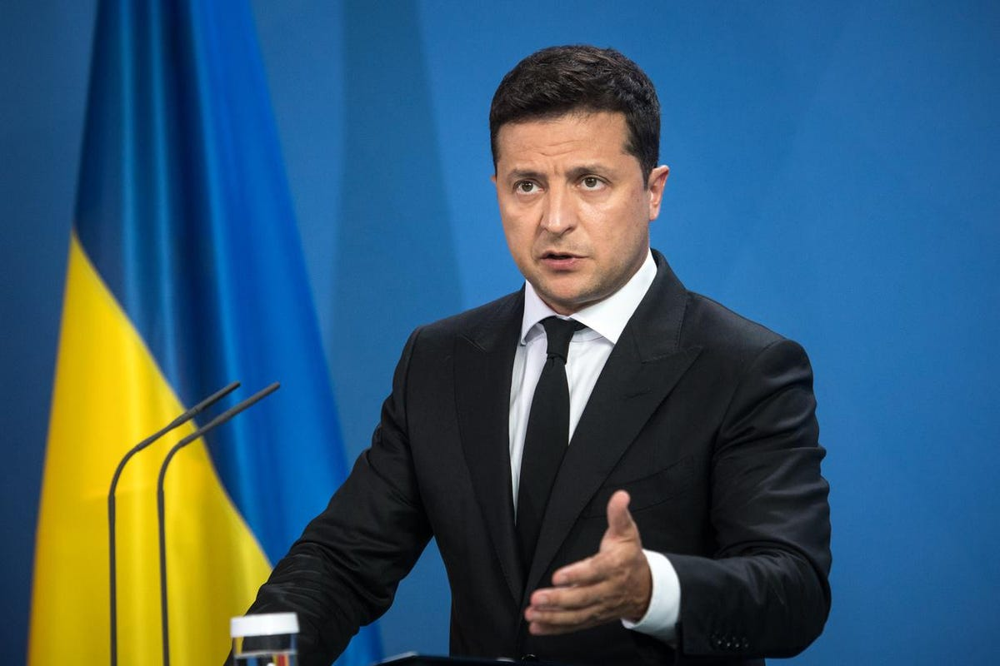

predicte: daoko
distance: 1.2510044574737549
score: 43.13616102392024 %


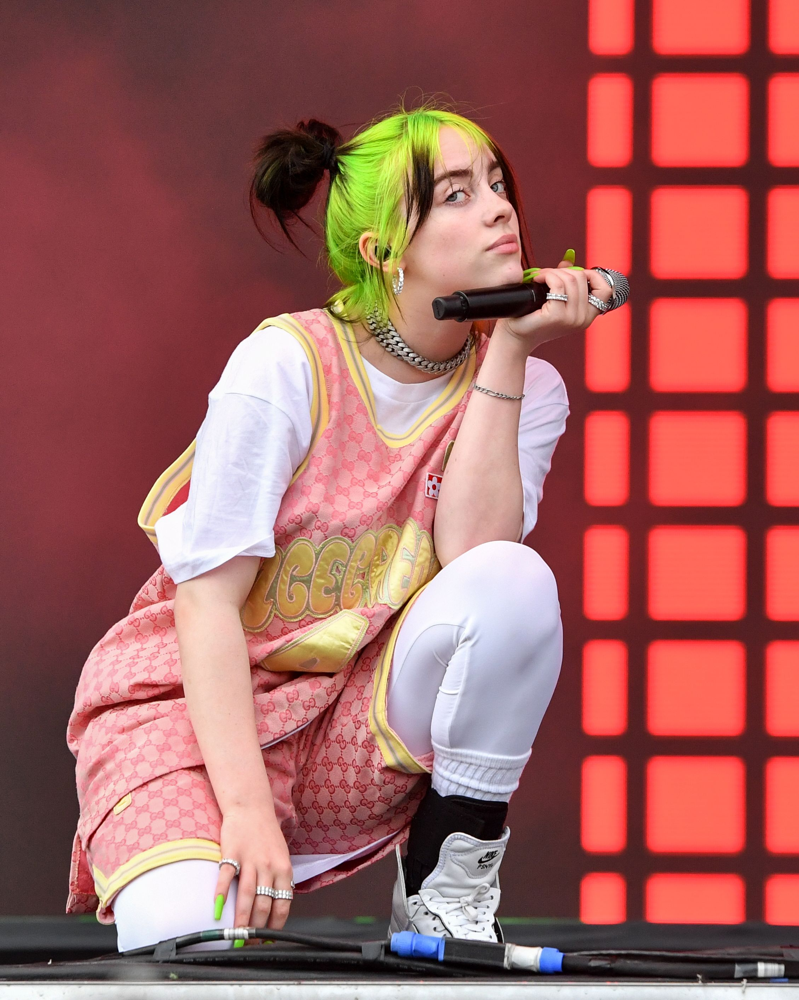

predicte: billie
distance: 0.9567339221636454
score: 56.51209444710703 %


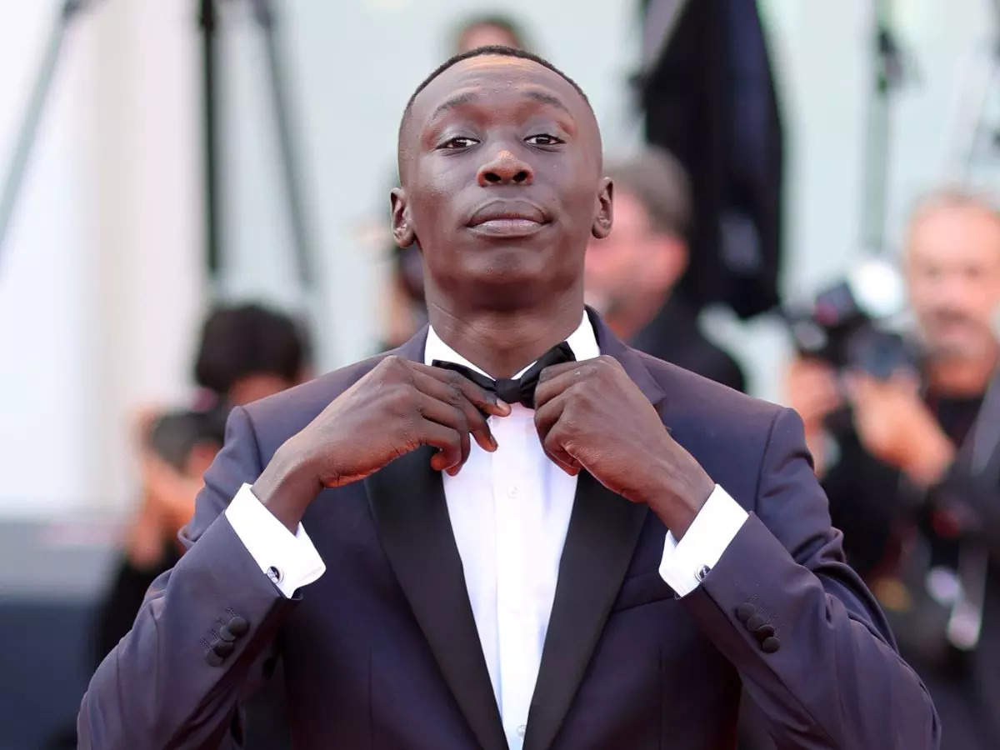

predicte: khaby
distance: 0.6692049503326416
score: 69.58159316669811 %


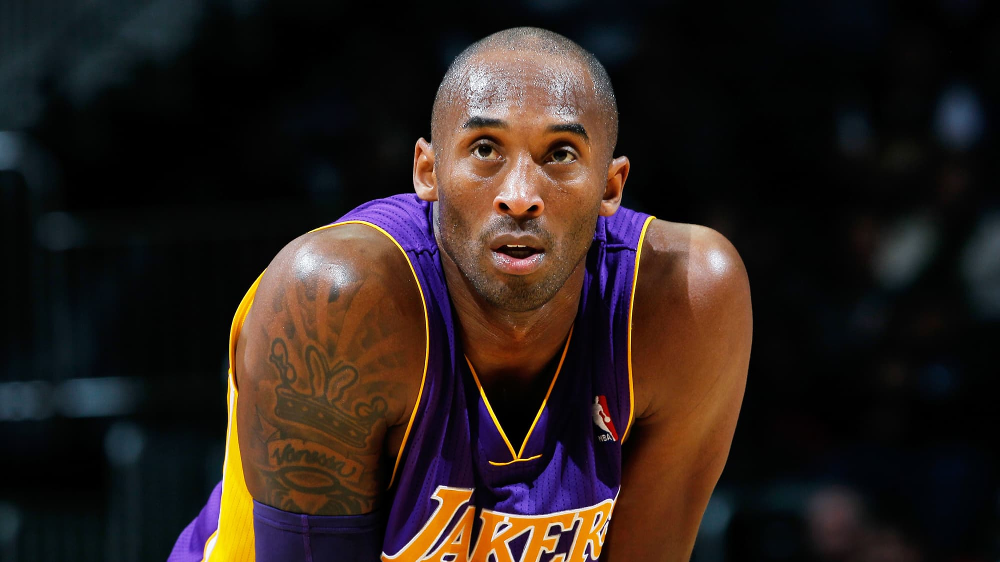

predicte: rock
distance: 1.0125049153963726
score: 53.97704930016489 %


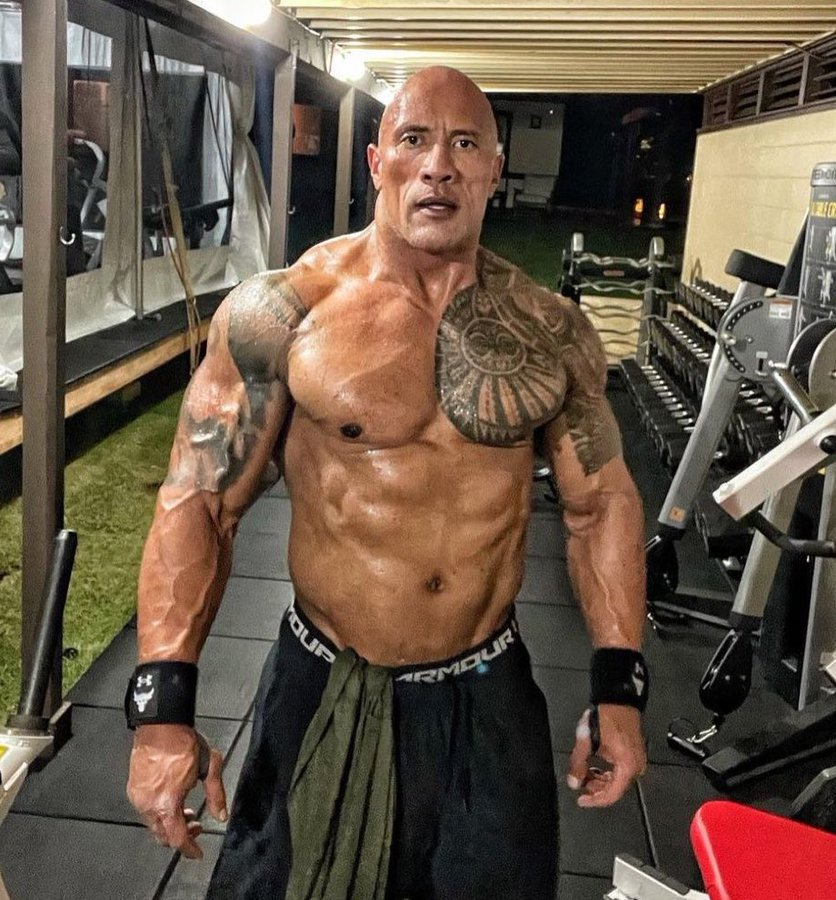

predicte: rock
distance: 0.714217483997345
score: 67.53556890921159 %


In [142]:
for target_pth in glob.glob(os.path.join(test_pth, '*[.jpg-.jpeg]')):
    img = Image.open(target_pth)
    display(img)
    
    img_cropped = mtcnn(img)
    img_emb = resnet(img_cropped.unsqueeze(0)).detach().numpy()[0]    # to numpy

    distance_dict = {}
    for label in emb_dict:
        emb_distance = 0
        norm = len(emb_dict[label])

        if '_' in emb_dict[label]: continue

        for vec in emb_dict[label]:
            emb_distance += np.linalg.norm(img_emb - vec)

        emb_distance /= norm
        distance_dict[label] = emb_distance
        
    label_keys = list(distance_dict.keys())
    min_dis = min(list(distance_dict.values()))
    min_idx = list(distance_dict.values()).index(min_dis)
    pred_label = label_keys[min_idx]

    thresh = 2.2
    score = ((thresh-min_dis)/thresh)*100

    print('predicte:', pred_label)
    print('distance:', min_dis)
    print(f'score: {score} %')

In [92]:
import sqlite3
con = sqlite3.connect('emb_vector.db')
res = con.execute('CREATE TABLE emb_vec')
res.fetchone()

OperationalError: incomplete input